# Skin Type Recognition

**Domain :** Machine Learning / AI

**Problem Name :** Build Mathematical model using ML and signal processing concept to process the skin issues into dryness and oiliness.

**Description :** Patients face a lot of problems with their skin. The main issue remains with the type of skin they have. Depending on the type of skin various skin diseases can occur. So if the skin is too dry it may start to peel and lead to various skin diseases like Psoriasis, Eczema etc. likewise too oily skin can lead to pimples which in turn can lead to scars. So the identification of skin type is of utmost need.

In [ ]:
import urllib.request
import ssl
ssl._create_default_https_context = ssl._create_unverified_context


In [ ]:
urllib.request.urlretrieve(url, 'helper_functions.py')

In [ ]:
!pip install --upgrade --force-reinstall scikit-learn


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 21.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 31.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.2/302.2 kB 10.3 MB/s eta 0:00:00
  Attempting uninstall: threadpoolctl
    Found existing installation: threadpoolctl 3.4.0
    Uninstalling threadpoolctl-3.4.0:
      Successfully uninstalled threadpoolctl-3.4.0
  Attempting uninstall: numpy
    Found existing installation: numpy 1.25.2
    Uninstalling numpy-1.25.2:
      Successfully uninstalled numpy-1.25.2
  Attempting uninstall: joblib
    Found existing installation: joblib 1.3.2
    Uninstalling joblib-1.3.2:
      Successfully uninstalled joblib-1.3.2
  Attempting uninstall: scipy
    Found existing installation: scipy 1.11.4
    Uninstalling scipy-1.11.4:
      Successfully uninstalled scipy-1.11.4
  Attempting uninstall: scikit-learn
   

In [ ]:
import sys
sys.path.append('/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages')

In [ ]:
from sklearn.metrics import confusion_matrix


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Importing dependancies
import os
import random
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from helper_functions import plot_loss_curves, compare_historys, make_confusion_matrix

In [ ]:
# Setting dir paths
oil_dir = "/content/drive/My Drive/Real-TIme-Skin-Type-Detection-main/skin-dataset/oily"
dry_dir = "/content/drive/My Drive/Real-TIme-Skin-Type-Detection-main/skin-dataset/dry"

In [ ]:
# Getting all the paths in a list for oil and dry skins
oil_list = []
for path in os.listdir(oil_dir):
  oil_list.append(oil_dir + "/" + path)

dry_list = []
for path in os.listdir(dry_dir):
  dry_list.append(dry_dir + "/" + path)

In [ ]:
# Preprocess img function
IMG_SIZE = (224, 224)
def load_and_prep(filepath):
  img_path = tf.io.read_file(filepath)
  img = tf.io.decode_image(img_path)
  img = tf.image.resize(img, IMG_SIZE)

  return img

In [ ]:
# Getting only those images which are suitable
def corrImgs(arr):
  corrImgList = []
  for path in arr:
    img = load_and_prep(path)
    if (img.shape[2] == 3) | (img.shape == 4):
      corrImgList.append(path)

  return corrImgList

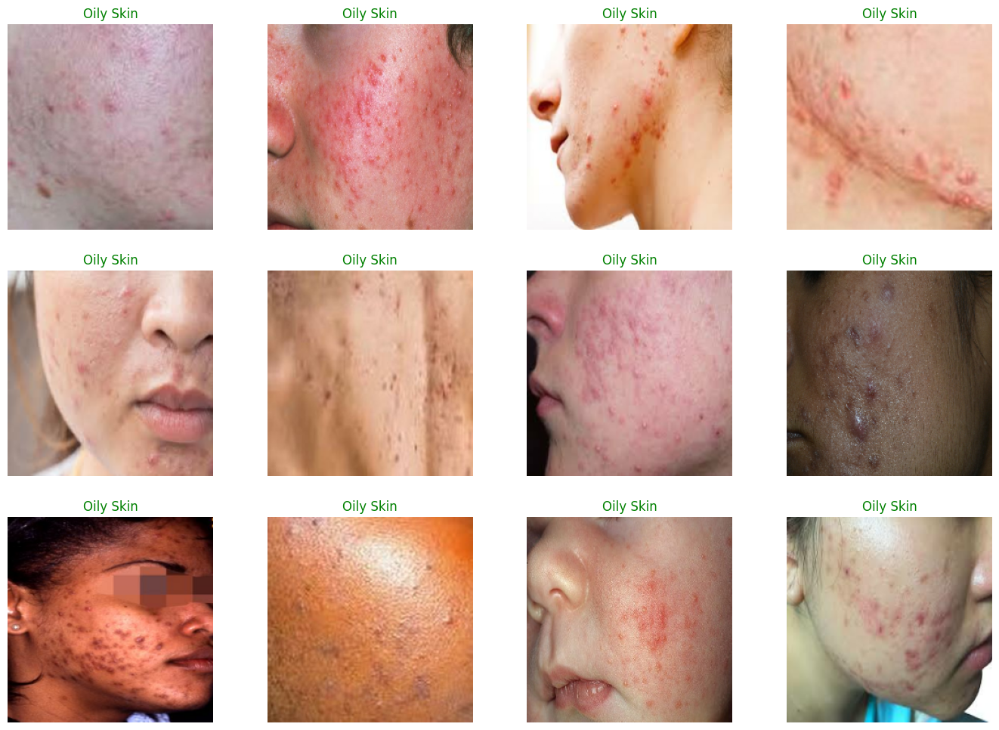

In [ ]:
# Randomly plotting the Oily Skin images
random_oil_skin = np.random.choice(oil_list, size=12, replace=False)
plt.figure(figsize=(17, 12))
for i in range(12):
  img_path = random_oil_skin[i]
  img = load_and_prep(img_path)

  # plotting the images
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(img/255)
  plt.title("Oily Skin", color="green")

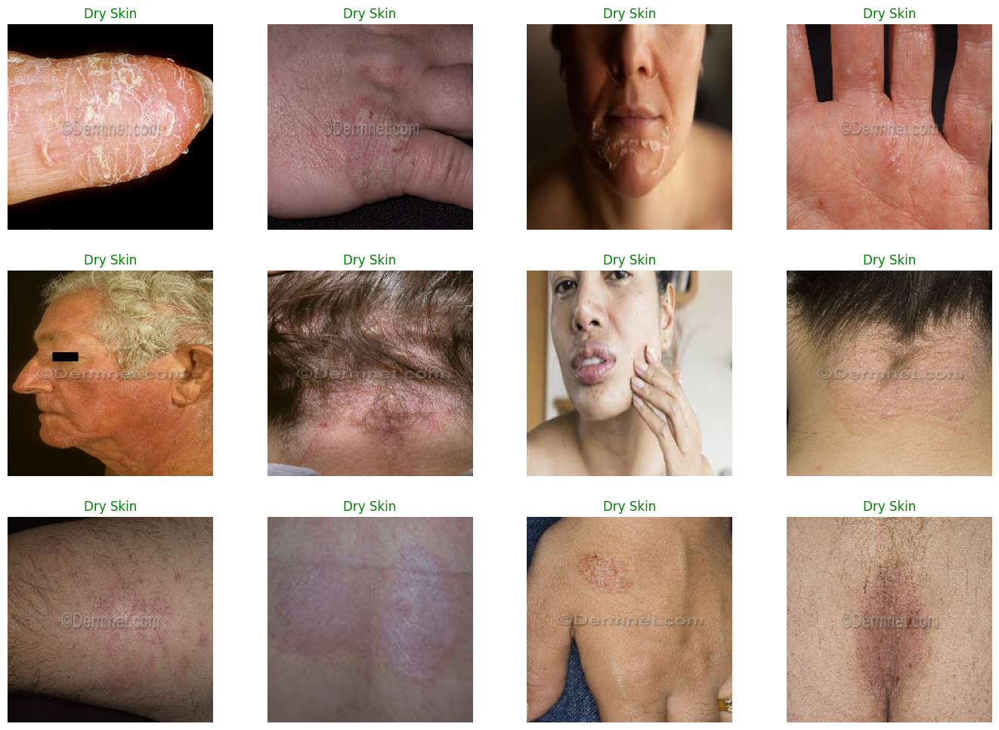

In [ ]:
# Randomly plotting the Dry Skin images
random_dry_skin = np.random.choice(dry_list, size=12, replace=False)
plt.figure(figsize=(17, 12))
for i in range(12):
  img_path = random_dry_skin[i]
  img = load_and_prep(img_path)

  # plotting the images
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(img/255)
  plt.title("Dry Skin", color="green")

In [ ]:
# Creating data augmentation layer
data_augmentation = tf.keras.Sequential([
   preprocessing.RandomFlip("horizontal"),
   preprocessing.RandomRotation(0.2),
   preprocessing.RandomZoom(0.2),
   preprocessing.RandomHeight(0.2),
  preprocessing.RandomWidth(0.2)
], name="data_augmentation_layer")

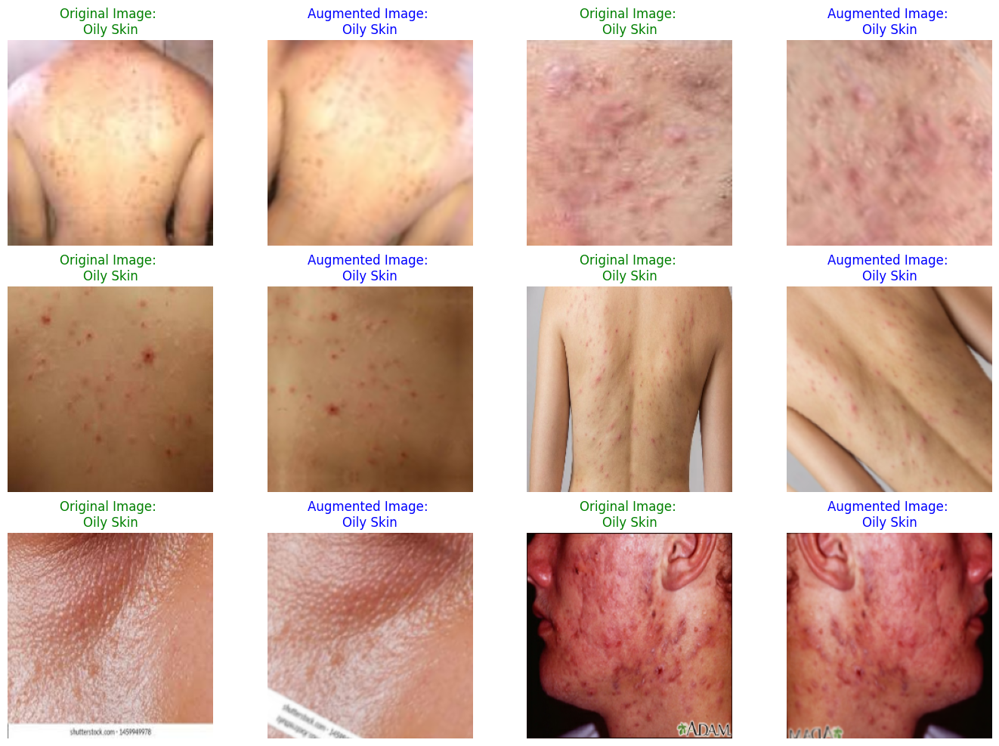

In [ ]:
# Visualizing multiple randomly augmented oily skin images
plt.figure(figsize=(17, 12))
for i in range(1, 12, 2):
  random_class = "Oily Skin"
  random_img_path = random.choice(oil_list)

  img = load_and_prep(random_img_path)
  aug_img = data_augmentation(tf.expand_dims(img, axis=0))
  aug_img = tf.image.resize(aug_img[0], IMG_SIZE)

  # Plotting original image
  plt.subplot(3, 4, i)
  plt.axis(False)
  plt.imshow(img / 255)
  plt.title(f"Original Image: \n{random_class}", color="green")

  # Plotting augmented image
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(aug_img / 255)
  plt.title(f"Augmented Image: \n{random_class}", color="blue");

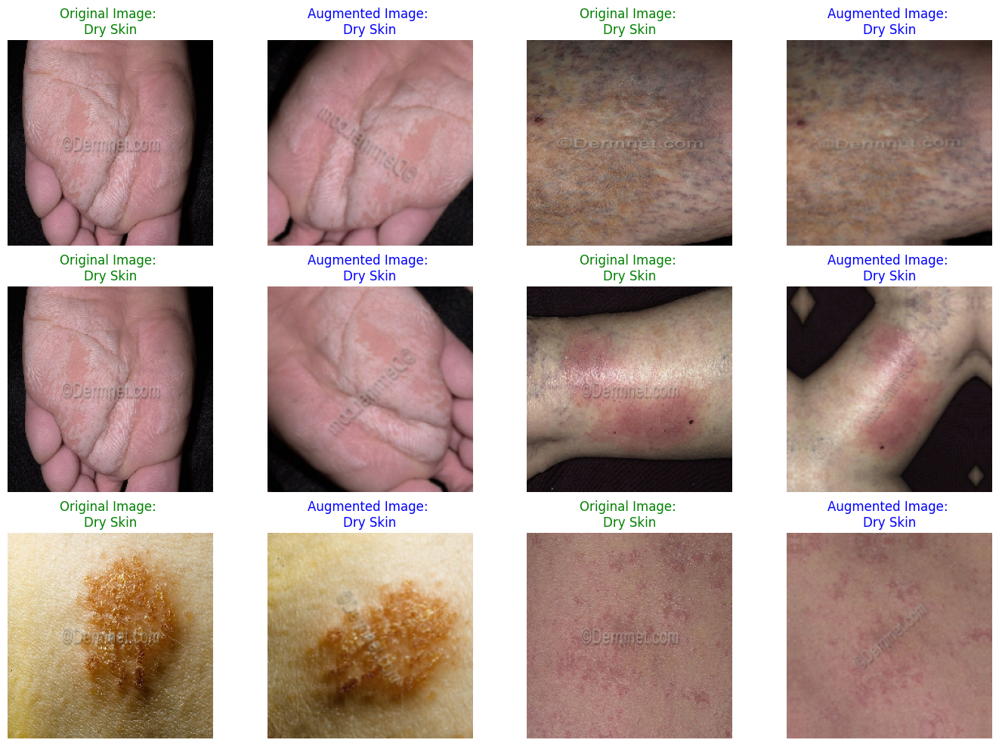

In [ ]:
# Visualizing multiple randomly augmented dry skin images
plt.figure(figsize=(17, 12))
for i in range(1, 12, 2):
  random_class = "Dry Skin"
  random_img_path = random.choice(dry_list)

  img = load_and_prep(random_img_path)
  aug_img = data_augmentation(tf.expand_dims(img, axis=0))
  aug_img = tf.image.resize(aug_img[0], IMG_SIZE)

  # Plotting original image
  plt.subplot(3, 4, i)
  plt.axis(False)
  plt.imshow(img / 255)
  plt.title(f"Original Image: \n{random_class}", color="green")

  # Plotting augmented image
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(aug_img / 255)
  plt.title(f"Augmented Image: \n{random_class}", color="blue");

In [ ]:
# Train test splits
data_gen = ImageDataGenerator(validation_split=0.2)

train_data = data_gen.flow_from_directory(directory="/content/drive/My Drive/Real-TIme-Skin-Type-Detection-main/skin-dataset",
                                          subset='training',
                                          target_size=IMG_SIZE,
                                          shuffle=True)

test_data = data_gen.flow_from_directory(directory="/content/drive/My Drive/Real-TIme-Skin-Type-Detection-main/skin-dataset/",
                                         subset='validation',
                                         target_size=IMG_SIZE,
                                         shuffle=True)

Found 412 images belonging to 2 classes.
Found 102 images belonging to 2 classes.


In [ ]:
len(train_data), len(test_data)

(13, 4)

## Building the Model

In [ ]:
# Setting up base model
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

# Setting up input layer
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_augmentation(inputs)
x = base_model(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling")(x)
outputs = tf.keras.layers.Dense(2, activation="softmax", name="output_layer")(x)
model_1 = tf.keras.Model(inputs, outputs)

# compiling the model
model_1.compile(loss=tf.keras.losses.categorical_crossentropy,
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

# fit the model
history_1 = model_1.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=0.25 * len(test_data))

16705208/16705208 [==============================] - 0s 0us/step
Epoch 1/5
13/13 [==============================] - 30s 1s/step - loss: 0.6244 - accuracy: 0.6796 - val_loss: 0.3041 - val_accuracy: 0.8750
Epoch 2/5
13/13 [==============================] - 15s 1s/step - loss: 0.3612 - accuracy: 0.8617 - val_loss: 0.2180 - val_accuracy: 0.9375
Epoch 3/5
13/13 [==============================] - 11s 797ms/step - loss: 0.2617 - accuracy: 0.9296 - val_loss: 0.1787 - val_accuracy: 0.9688
Epoch 4/5
13/13 [==============================] - 11s 778ms/step - loss: 0.2060 - accuracy: 0.9417 - val_loss: 0.1378 - val_accuracy: 0.9688
Epoch 5/5
13/13 [==============================] - 12s 893ms/step - loss: 0.1921 - accuracy: 0.9393 - val_loss: 0.1398 - val_accuracy: 0.9688


In [ ]:
# Evaluating the model
model_1.evaluate(test_data)

4/4 [==============================] - 2s 617ms/step - loss: 0.1347 - accuracy: 0.9706


[0.13466840982437134, 0.970588207244873]

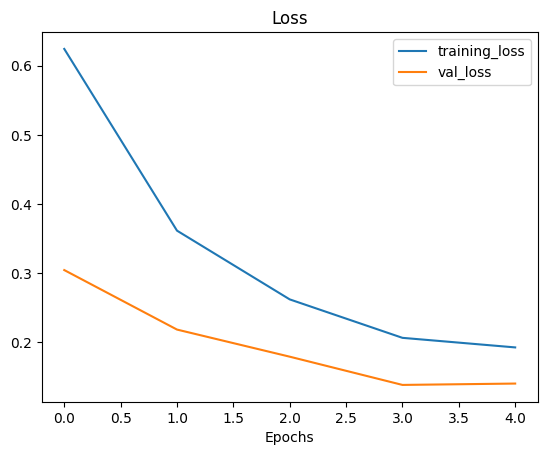

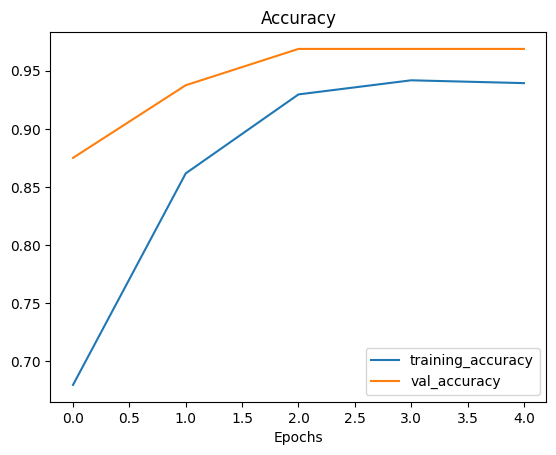

In [ ]:
# Plotting loss curves
plot_loss_curves(history_1)

In [ ]:
# Saving the model
model_1.save("/content/drive/My Drive/Real-TIme-Skin-Type-Detection-main/RealTimeDetection.keras", save_format="keras")


In [ ]:
# Unfreeze all of the layers in the base model
base_model.trainable = True

# Refreeze every layer except for the last 5
for layer in base_model.layers[:-5]:
  layer.trainable = False

# Recompile model with lower learning rate
model_1.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(1e-4),
                metrics=['accuracy'])

# Fine-tune for 5 more epochs
fine_tune_epochs = 10

history_1_fine_tune_1 = model_1.fit(train_data,
                                    epochs=fine_tune_epochs,
                                    validation_data=test_data,
                                    validation_steps= 0.25 * len(test_data),
                                    initial_epoch=history_1.epoch[-1])

Epoch 5/10
13/13 [==============================] - 20s 886ms/step - loss: 0.1770 - accuracy: 0.9442 - val_loss: 0.0819 - val_accuracy: 1.0000
Epoch 6/10
13/13 [==============================] - 11s 789ms/step - loss: 0.1418 - accuracy: 0.9563 - val_loss: 0.1575 - val_accuracy: 0.9375
Epoch 7/10
13/13 [==============================] - 8s 598ms/step - loss: 0.1091 - accuracy: 0.9636 - val_loss: 0.1422 - val_accuracy: 0.9375
Epoch 8/10
13/13 [==============================] - 10s 749ms/step - loss: 0.0985 - accuracy: 0.9660 - val_loss: 0.0617 - val_accuracy: 1.0000
Epoch 9/10
13/13 [==============================] - 10s 746ms/step - loss: 0.0839 - accuracy: 0.9806 - val_loss: 0.0554 - val_accuracy: 1.0000
Epoch 10/10
13/13 [==============================] - 9s 669ms/step - loss: 0.0890 - accuracy: 0.9684 - val_loss: 0.1457 - val_accuracy: 0.9375


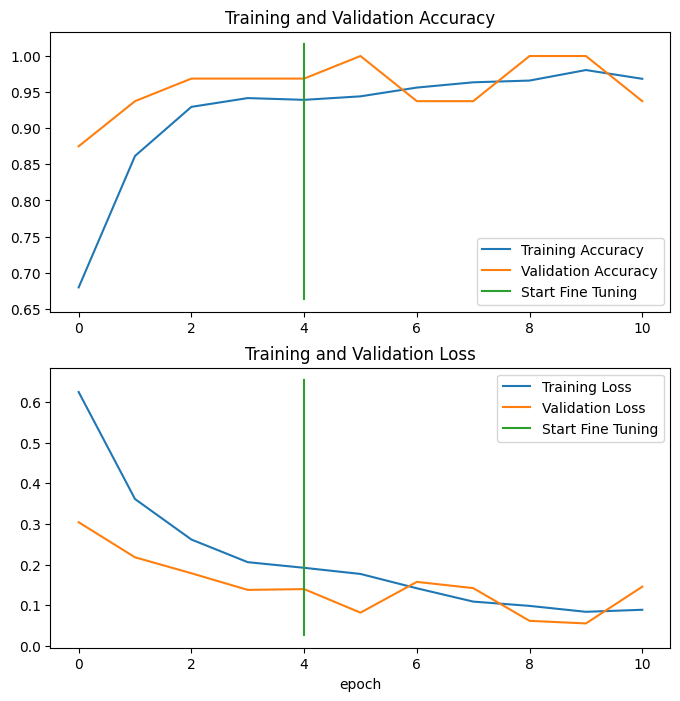

In [ ]:
compare_historys(history_1, history_1_fine_tune_1)

In [ ]:
# Model summary
model_1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, None   0         
 equential)                  )                                   
                                                                 
 efficientnetb0 (Functional  (None, None, None, 1280   4049571   
 )                           )                                   
                                                                 
 global_average_pooling (Gl  (None, 1280)              0         
 obalAveragePooling2D)                                           
                                                                 
 output_layer (Dense)        (None, 2)                 2562      
                                                             

In [ ]:
# Getting test image file paths
test_data_img_paths = test_data.filepaths
np.random.shuffle(test_data_img_paths)

# Getting labels
test_data_labels = []
for path in test_data_img_paths:
  test_data_labels.append(path.split("/")[5])

# Creating a dataframe of test paths
df_test_data_img_paths = pd.DataFrame({"Img Paths": test_data_img_paths,
                                       "Labels": test_data_labels})

df_test_data_img_paths.head()

,Img Paths,Labels
0,/content/drive/My Drive/Real-TIme-Skin-Type-De...,skin-dataset
1,/content/drive/My Drive/Real-TIme-Skin-Type-De...,skin-dataset
2,/content/drive/My Drive/Real-TIme-Skin-Type-De...,skin-dataset
3,/content/drive/My Drive/Real-TIme-Skin-Type-De...,skin-dataset
4,/content/drive/My Drive/Real-TIme-Skin-Type-De...,skin-dataset


In [ ]:
len(df_test_data_img_paths)

102

In [ ]:
# Generating a test dataset for
test_data_shuff = data_gen.flow_from_dataframe(df_test_data_img_paths,
                                               directory="/content/drive/My Drive/Real-TIme-Skin-Type-Detection-main/skin-dataset",
                                               x_col='Img Paths', y_col='Labels',
                                               shuffle=False,
                                               target_size=(224, 224))

Found 102 validated image filenames belonging to 1 classes.


In [ ]:
# Loading the best model
# The same model architecture was trained on tensorflow==2.3.0 and then loaded here, trained on Tesla-K80
model = tf.keras.models.load_model("/content/drive/My Drive/Real-TIme-Skin-Type-Detection-main/Skin-Type-Recognition-Degraded")

In [ ]:
# Getting prediction probabilities
pred_prob = model.predict(test_data_shuff)
print(pred_prob[:20])  # Printing the prediction probabilities for the first 20 samples


4/4 [==============================] - 3s 295ms/step
[[9.9853921e-01 1.4607550e-03]
 [9.9902177e-01 9.7824330e-04]
 [9.9891663e-01 1.0833755e-03]
 [9.9946147e-01 5.3853227e-04]
 [9.9981314e-01 1.8685416e-04]
 [8.8170357e-02 9.1182959e-01]
 [9.9955529e-01 4.4471156e-04]
 [3.1109956e-01 6.8890047e-01]
 [9.9965680e-01 3.4315322e-04]
 [5.8075166e-01 4.1924831e-01]
 [9.8042917e-01 1.9570827e-02]
 [9.0857327e-01 9.1426693e-02]
 [2.3837100e-01 7.6162905e-01]
 [9.9759173e-01 2.4082747e-03]
 [9.9713731e-01 2.8626525e-03]
 [9.8340833e-01 1.6591668e-02]
 [9.9813181e-01 1.8682587e-03]
 [3.4211150e-01 6.5788853e-01]
 [9.9674892e-01 3.2511298e-03]
 [9.7499156e-01 2.5008436e-02]]


In [ ]:
y_pred = pred_prob.argmax(axis=1)
y_pred[:20]

array([0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0])

In [ ]:
# Labels
test_data.class_indices

{'dry': 0, 'oily': 1}

In [ ]:
# Converting our text labels into numbers
y_true = []
for label in test_data_labels:
  label_ = 0 if label == "dry" else 1
  y_true.append(label_)

y_true  = np.array(y_true)
y_true[:20]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

/content/helper_functions.py:60: RuntimeWarning: invalid value encountered in divide
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it


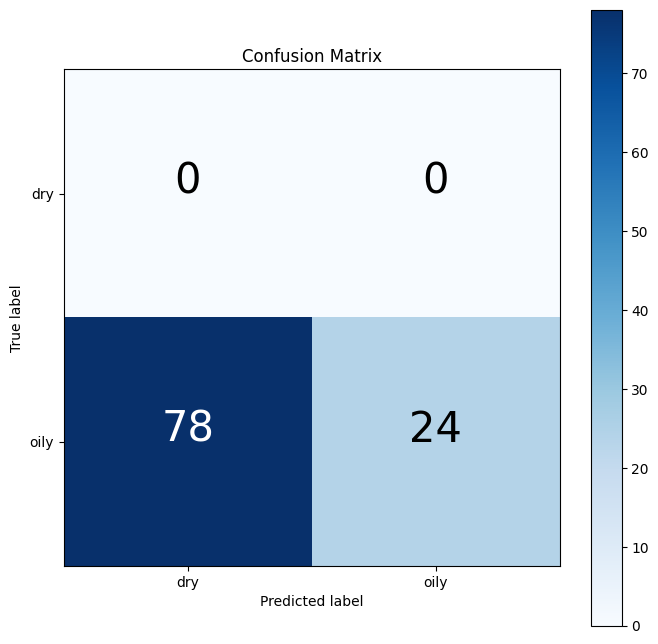

In [ ]:
# Plotting a confusion matrix
class_names = ["dry", "oily"]

make_confusion_matrix(y_true=y_true,
                      y_pred=y_pred,
                      classes=class_names,
                      figsize=(8, 8),
                      text_size=30,
                      norm=False)

In [ ]:
# To get suitable images
corrImgList = corrImgs(test_data_img_paths)

1/1 [==============================] - 0s 25ms/step


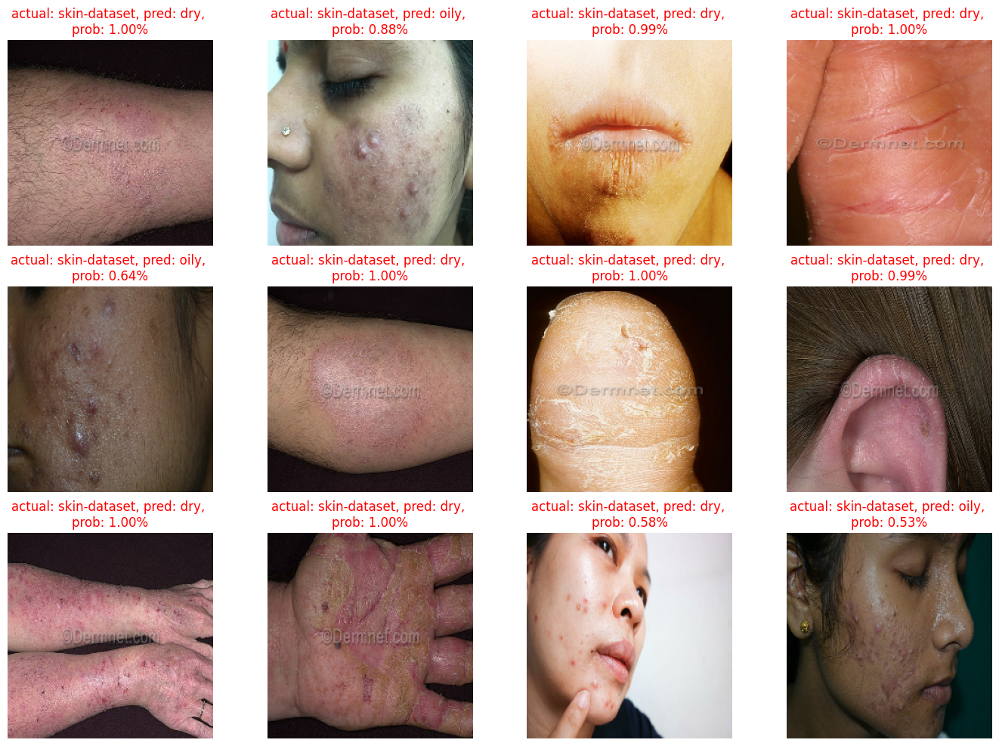

In [ ]:
path_list = np.random.choice(corrImgList, size=12, replace=False)
plt.figure(figsize=(17, 12))
for i in range(12):
  img_path = path_list[i]
  class_name = img_path.split("/")[5]
  img = load_and_prep(img_path)

  pred_prob  = model.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names[pred_prob.argmax()]

  # Plot the image(s)
  plt.subplot(3, 4, i+1)
  plt.imshow(img/255.)
  title_color = "g" if class_name == pred_class else "r"
  plt.title(f"actual: {class_name}, pred: {pred_class}, \nprob: {pred_prob.max():.2f}%", c=title_color)
  plt.axis(False);

In [ ]:
# Getting test labels
test_labels = []
for path in test_data_img_paths:
  test_labels.append(path.split("/")[6])

test_labels[:6]

['dry', 'dry', 'dry', 'dry', 'dry', 'oily']

In [ ]:
df_pred = pd.DataFrame({"filename" : test_data_img_paths,
                         "label": test_labels,
                         "True": y_true,
                         "pred": y_pred})

df_pred.head(10)

,filename,label,True,pred
0,/content/drive/My Drive/Real-TIme-Skin-Type-De...,dry,1,0
1,/content/drive/My Drive/Real-TIme-Skin-Type-De...,dry,1,0
2,/content/drive/My Drive/Real-TIme-Skin-Type-De...,dry,1,0
3,/content/drive/My Drive/Real-TIme-Skin-Type-De...,dry,1,0
4,/content/drive/My Drive/Real-TIme-Skin-Type-De...,dry,1,0
5,/content/drive/My Drive/Real-TIme-Skin-Type-De...,oily,1,1
6,/content/drive/My Drive/Real-TIme-Skin-Type-De...,dry,1,0
7,/content/drive/My Drive/Real-TIme-Skin-Type-De...,oily,1,1
8,/content/drive/My Drive/Real-TIme-Skin-Type-De...,dry,1,0
9,/content/drive/My Drive/Real-TIme-Skin-Type-De...,oily,1,0


In [ ]:
df_pred.to_csv("test-preds.csv")

In [ ]:
len(test_data_img_paths)

102

In [ ]:
# Wrong predicted images
wrng_pred_test_paths = []
for i in range(len(test_data_img_paths)):
  if y_true[i] != y_pred[i]:
    wrng_pred_test_paths.append(test_data_img_paths[i])

len(wrng_pred_test_paths)

78

1/1 [==============================] - 0s 25ms/step


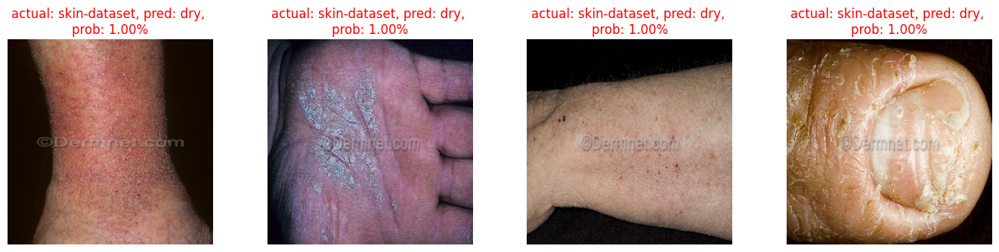

In [ ]:
# Wrongly predicted images
plt.figure(figsize=(17, 12))
for i in range(4):
  img_path = wrng_pred_test_paths[i]
  class_name = img_path.split("/")[5]
  img = load_and_prep(img_path)

  pred_prob  = model.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names[pred_prob.argmax()]

  # Plot the image(s)
  plt.subplot(3, 4, i+1)
  plt.imshow(img/255.)
  title_color = "g" if class_name == pred_class else "r"
  plt.title(f"actual: {class_name}, pred: {pred_class}, \nprob: {pred_prob.max():.2f}%", c=title_color)
  plt.axis(False);